In [1]:
pip install chromadb

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install open-clip-torch

Note: you may need to restart the kernel to use updated packages.


In [42]:
import os
import chromadb
import numpy as np
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt


In [4]:
from chromadb.utils.embedding_functions import OpenCLIPEmbeddingFunction

Get Data

In [5]:
ROOT = 'data'
CLASS_NAME = sorted(list(os.listdir(f'{ROOT}/train')))

The process of performing image queries using the CLIP model in this context is similar to the steps in the basic image retrieval, but we will upgrade it by adding a function to extract feature vectors for each image.


The CLIP model will be used to transform the images into feature vectors that represent the content and context of the images. After that, the comparison of images will not be done directly on the original images but through calculating the similarity between these vectors. The code snippet below initializes a function to extract feature vectors from an image using the CLIP model.

In [6]:
embedding_function = OpenCLIPEmbeddingFunction()

In [7]:

def get_single_image_embedding(image):
    embedding = embedding_function._encode_image(image=image)
    return np.array(embedding)

In [8]:
def read_image_from_path(path, size):
    im = Image.open(path).convert('RGB').resize(size)
    return np.array(im)




def folder_to_images(folder, size):

    list_dir = [folder + '/' + name for name in os.listdir(folder)]

    images_np = np.zeros(shape=(len(list_dir), *size, 3))
    images_path = []
    for i, path in enumerate(list_dir):
        images_np[i] = read_image_from_path(path, size)
        images_path.append(path)

    images_path = np.array(images_path)
    return images_np, images_path

In [9]:
def plot_results(querquery_pathy, ls_path_score, reverse):
    fig = plt.figure(figsize=(15, 9))
    fig.add_subplot(2, 3, 1)
    plt.imshow(read_image_from_path(querquery_pathy, size=(448, 448)))
    plt.title(f"Query Image: {querquery_pathy.split('/')[2]}", fontsize=16)
    plt.axis("off")
    for i, path in enumerate(sorted(ls_path_score, key=lambda x: x[1], reverse=reverse)[:5], 2):
        fig.add_subplot(2, 3, i)
        plt.imshow(read_image_from_path(path[0], size=(448, 448)))
        plt.title(f"Top {i-1}: {path[0].split('/')[2]}", fontsize=16)
        plt.axis("off")
    plt.show()

**1/Image Retrieval with embedding vector with L1 measure**

In [10]:
def absolute_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.sum(np.abs(data - query), axis=axis_batch_size)

In [11]:
def get_l1_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size)  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)
            rates = absolute_difference(query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

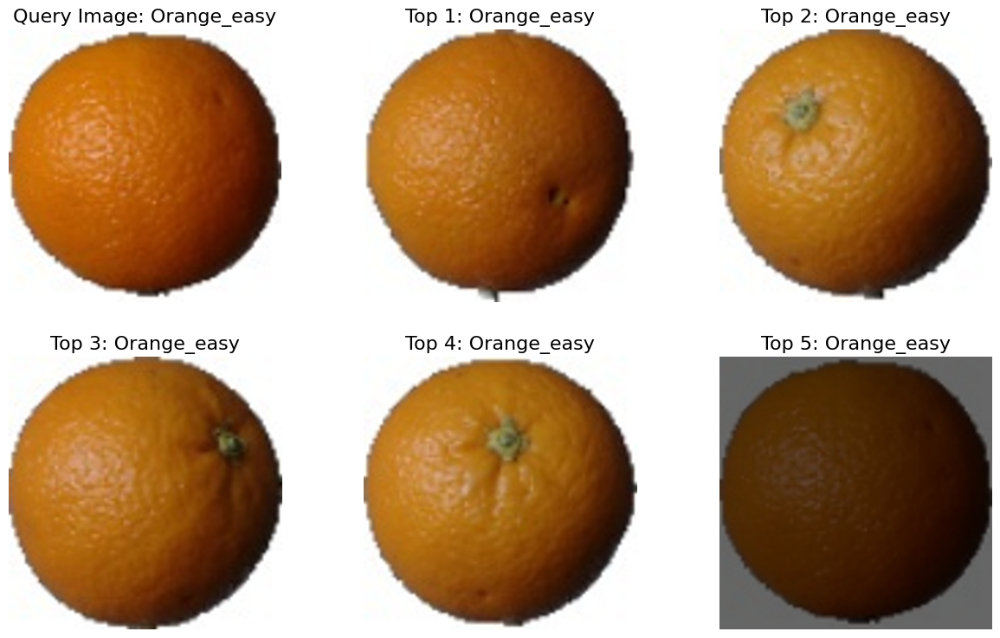

In [12]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

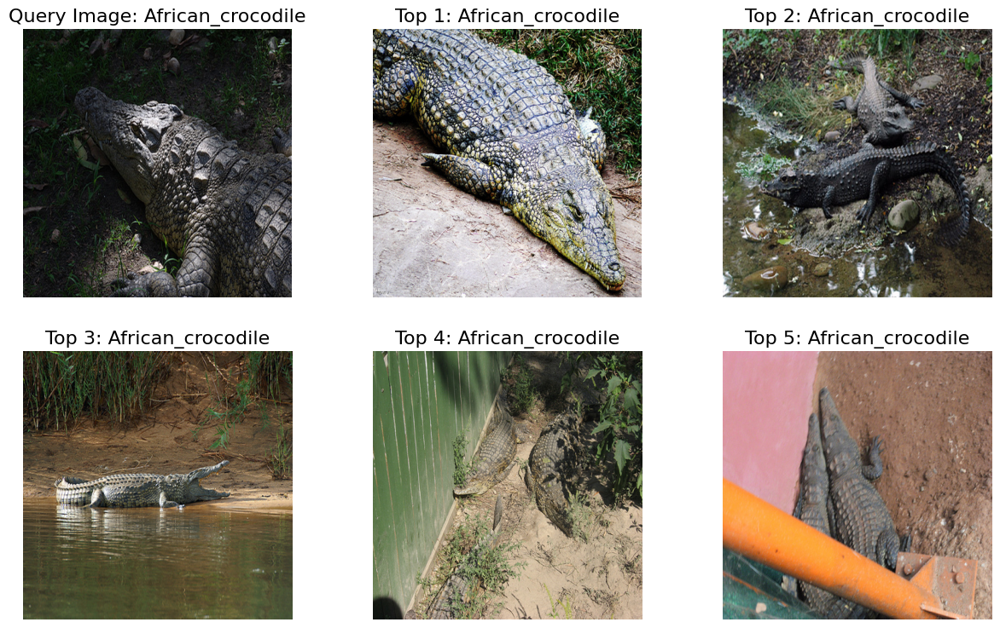

In [13]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l1_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [14]:
sorted(ls_path_score, key=lambda x: x[1])

[('data/train/African_crocodile/n01697457_10393.JPEG', 9.51279372593126),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 10.202179077437904),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 11.992317100229172),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 12.823916862747865),
 ('data/train/African_crocodile/n01697457_260.JPEG', 12.85738471591685),
 ('data/train/African_crocodile/n01697457_85.JPEG', 13.500172543062945),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 14.238460139207746),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 14.596683614829999),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 14.671802437347651),
 ('data/train/vine_snake/n01739381_5304.JPEG', 15.40766360337875),
 ('data/train/vine_snake/n01739381_5091.JPEG', 15.759098187330892),
 ('data/train/vine_snake/n01739381_5245.JPEG', 15.78438391268719),
 ('data/train/triceratops/n01704323_2435.JPEG', 15.979115778885898),
 ('data/train/triceratops/n01704323_541.JPEG', 15.9855953982

Mean Square Difference

In [15]:
def mean_square_difference(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    return np.mean((data - query)**2, axis=axis_batch_size)

In [16]:
def get_l2_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size)  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)
            rates = mean_square_difference(
                query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

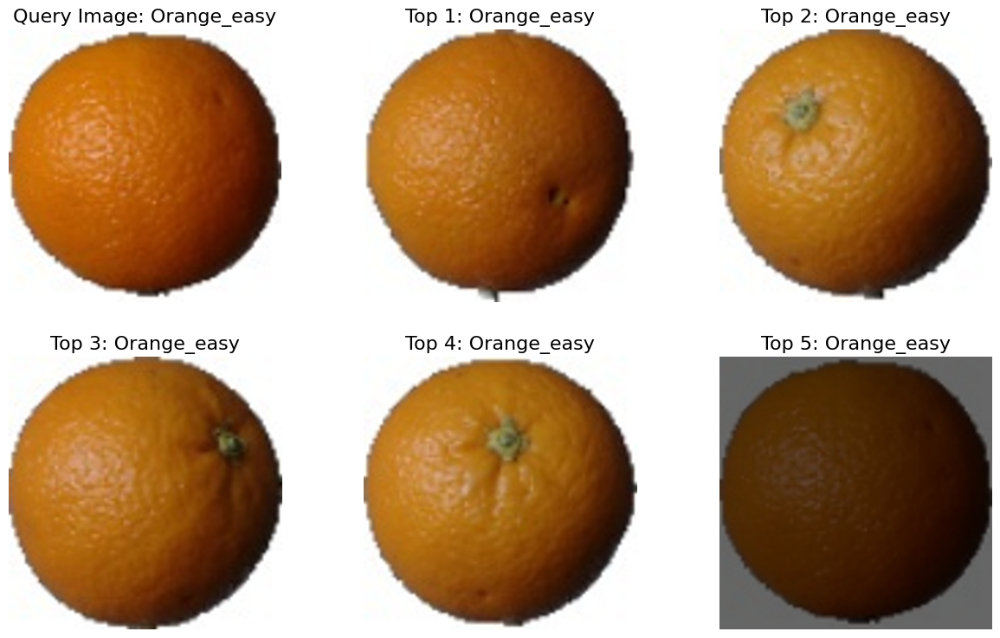

In [17]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

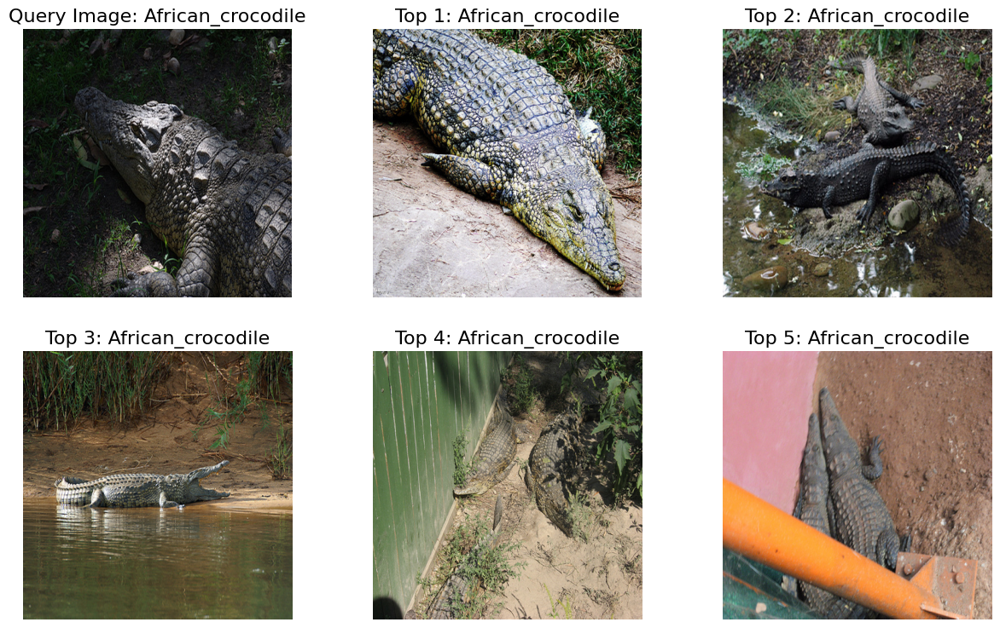

In [18]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_l2_score(root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=False)

In [19]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)

[('data/train/can_opener/n02951585_24554.JPEG', 0.0038607855244631537),
 ('data/train/safety_pin/n04127249_3657.JPEG', 0.0037208745244111424),
 ('data/train/comic_book/n06596364_4445.JPEG', 0.0036262013868687206),
 ('data/train/loudspeaker/n03691459_11843.JPEG', 0.0035901245607836054),
 ('data/train/ambulance/n02701002_4047.JPEG', 0.0035145152739480706),
 ('data/train/comic_book/n06596364_19168.JPEG', 0.0035091368799907005),
 ('data/train/loudspeaker/n03691459_15367.JPEG', 0.003495745941896713),
 ('data/train/loudspeaker/n03691459_58288.JPEG', 0.0034675565749787063),
 ('data/train/comic_book/n06596364_7928.JPEG', 0.003461536333627474),
 ('data/train/safety_pin/n04127249_1990.JPEG', 0.003458049659248197),
 ('data/train/screen/n04152593_2793.JPEG', 0.003449804685721632),
 ('data/train/knee_pad/n03623198_14574.JPEG', 0.0034468035027107715),
 ('data/train/knee_pad/n03623198_4415.JPEG', 0.003436605765883893),
 ('data/train/yawl/n04612504_10666.JPEG', 0.0034061591574779814),
 ('data/train/th

**Correlation Coefficient**

In [20]:
def correlation_coefficient(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))

    # Ứng dụng mean
    query_mean = query - np.mean(query)
    data_mean = data - np.mean(data, axis=axis_batch_size, keepdims=True)

    # Ứng dụng norm
    query_norm = np.sqrt(np.sum(query_mean**2))
    data_norm = np.sqrt(np.sum(data_mean**2, axis=axis_batch_size))

    return np.sum(data_mean * query_mean, axis=axis_batch_size) / (query_norm*data_norm + np.finfo(float).eps)

In [21]:
def get_correlation_coefficient_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size)  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)
            rates = correlation_coefficient(
                query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

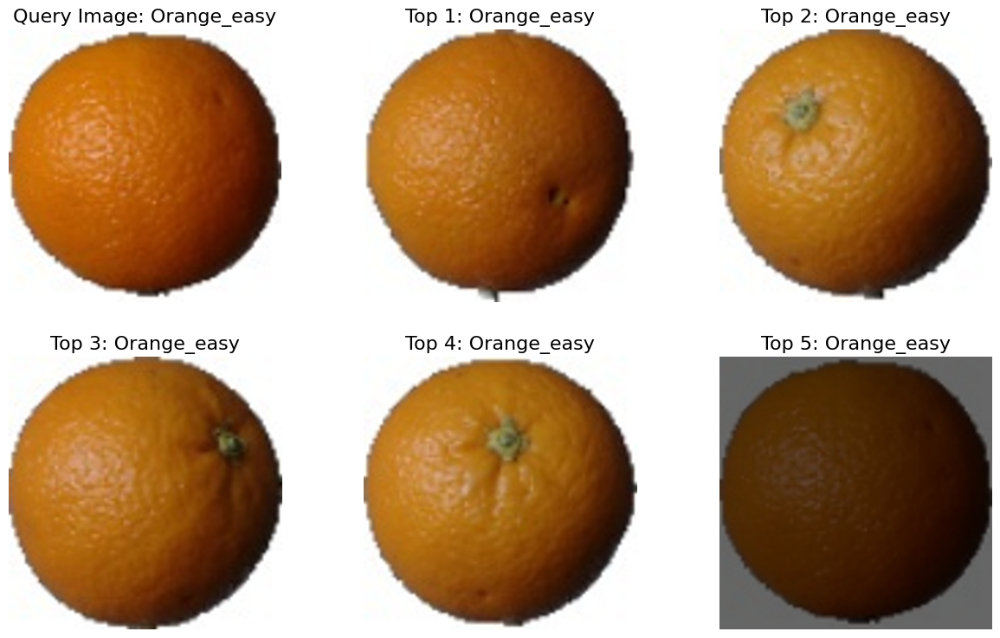

In [22]:
root_img_path = "data/train/"
query_path = "data/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(
    root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

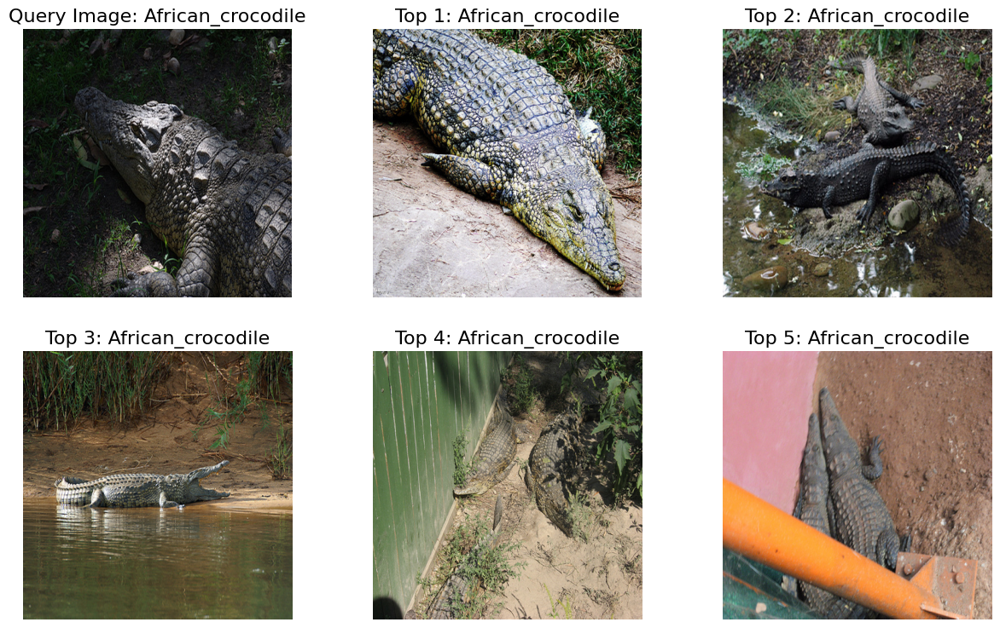

In [23]:
root_img_path = "data/train/"
query_path = "data/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_correlation_coefficient_score(
    root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [24]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.8569638532345955),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.8345372189735262),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.7759042057827465),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.7422257635937501),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.725569669802467),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.6951836217480906),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.6819438793284064),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.6695026111228279),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.6457237461877501),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.611589576080525),
 ('data/train/lynx/n02127052_3830.JPEG', 0.6006350936152325),
 ('data/train/vine_snake/n01739381_5091.JPEG', 0.5997228892540962),
 ('data/train/triceratops/n01704323_541.JPEG', 0.5943109511592923),
 ('data/train/vine_snake/n01739381_5245.JPEG', 0.593461263105091

Cosine Similarlity

In [25]:
def cosine_similarity(query, data):
    axis_batch_size = tuple(range(1, len(data.shape)))
    # Ứng dụng norm
    query_norm = np.sqrt(np.sum(query**2))
    data_norm = np.sqrt(np.sum(data**2, axis=axis_batch_size))
    return np.sum(data * query, axis=axis_batch_size) / (query_norm*data_norm + np.finfo(float).eps)

In [26]:
def get_cosine_similarity_score(root_img_path, query_path, size):
    query = read_image_from_path(query_path, size)
    query_embedding = get_single_image_embedding(query)
    ls_path_score = []
    for folder in os.listdir(root_img_path):
        if folder in CLASS_NAME:
            path = root_img_path + folder
            images_np, images_path = folder_to_images(
                path, size)  # mang numpy nhieu anh, paths
            embedding_list = []
            for idx_img in range(images_np.shape[0]):
                embedding = get_single_image_embedding(
                    images_np[idx_img].astype(np.uint8))
                embedding_list.append(embedding)
            rates = cosine_similarity(
                query_embedding, np.stack(embedding_list))
            ls_path_score.extend(list(zip(images_path, rates)))
    return query, ls_path_score

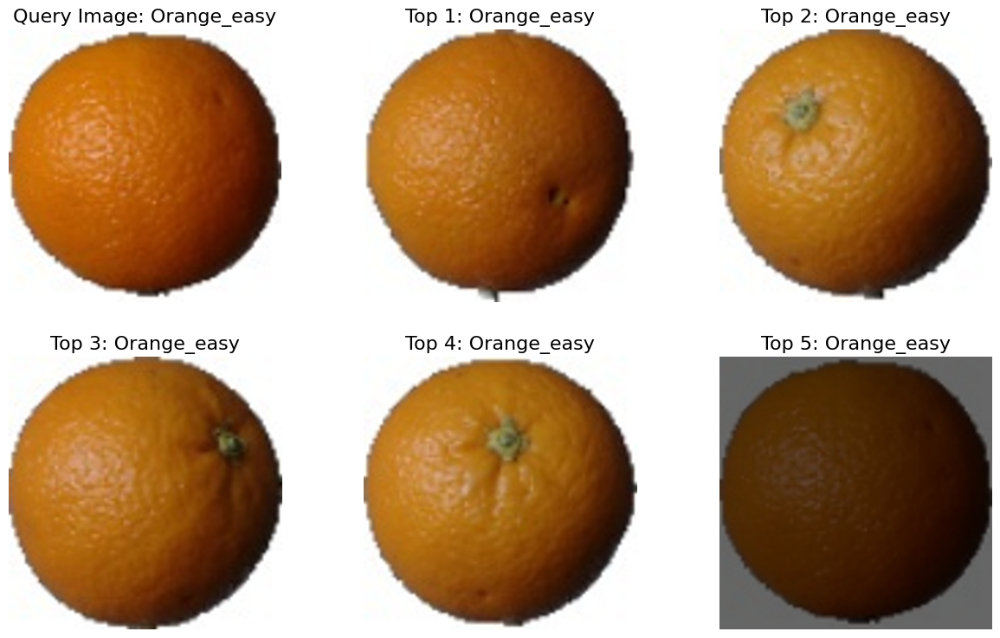

In [27]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/Orange_easy/0_100.jpg"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(
    root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

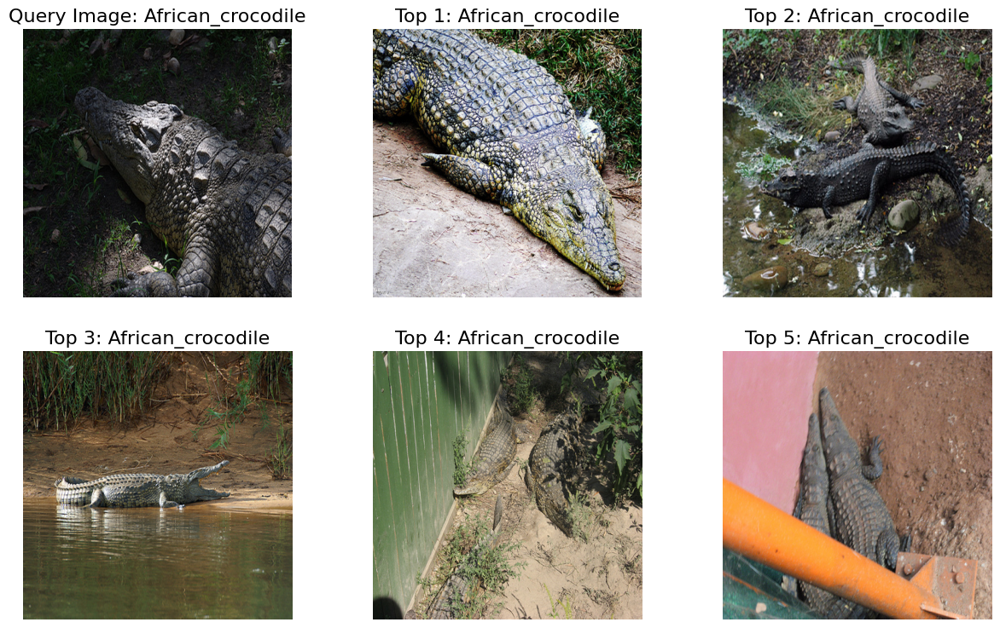

In [28]:
root_img_path = f"{ROOT}/train/"
query_path = f"{ROOT}/test/African_crocodile/n01697457_18534.JPEG"
size = (448, 448)
query, ls_path_score = get_cosine_similarity_score(
    root_img_path, query_path, size)
plot_results(query_path, ls_path_score, reverse=True)

In [29]:
sorted(ls_path_score, key=lambda x: x[1], reverse=True)

[('data/train/African_crocodile/n01697457_10393.JPEG', 0.8573006922987192),
 ('data/train/African_crocodile/n01697457_5586.JPEG', 0.8350830459182942),
 ('data/train/African_crocodile/n01697457_14906.JPEG', 0.776256501568226),
 ('data/train/African_crocodile/n01697457_1331.JPEG', 0.7426346082035816),
 ('data/train/African_crocodile/n01697457_260.JPEG', 0.7264268960634773),
 ('data/train/African_crocodile/n01697457_85.JPEG', 0.695930915302023),
 ('data/train/African_crocodile/n01697457_18587.JPEG', 0.6830197071008048),
 ('data/train/African_crocodile/n01697457_8136.JPEG', 0.669003501603205),
 ('data/train/ruffed_grouse/n01797886_17360.JPEG', 0.645879191988066),
 ('data/train/vine_snake/n01739381_5304.JPEG', 0.6117421205106823),
 ('data/train/lynx/n02127052_3830.JPEG', 0.6019296447010718),
 ('data/train/vine_snake/n01739381_5091.JPEG', 0.6006222204805273),
 ('data/train/triceratops/n01704323_541.JPEG', 0.5956480155505971),
 ('data/train/vine_snake/n01739381_5245.JPEG', 0.5950491734160853)

Optimize the process of retrieving image using CLIP model and vectordatabase

In [30]:
ROOT = 'data'
CLASS_NAME = sorted(list(os.listdir(f'{ROOT}/train')))
HNSW_SPACE = "hnsw:space"

In [31]:
def get_files_path(path):
    files_path = []
    for label in CLASS_NAME:
        label_path = path + "/" + label
        filenames = os.listdir(label_path)
        for filename in filenames:
            filepath = label_path + '/' + filename
            files_path.append(filepath)
    return files_path

In [52]:
data_path = f'{ROOT}/train'
files_path = get_files_path(path=data_path)
files_path

['data/train/African_crocodile/n01697457_10393.JPEG',
 'data/train/African_crocodile/n01697457_104.JPEG',
 'data/train/African_crocodile/n01697457_1331.JPEG',
 'data/train/African_crocodile/n01697457_14906.JPEG',
 'data/train/African_crocodile/n01697457_18587.JPEG',
 'data/train/African_crocodile/n01697457_260.JPEG',
 'data/train/African_crocodile/n01697457_5586.JPEG',
 'data/train/African_crocodile/n01697457_8136.JPEG',
 'data/train/African_crocodile/n01697457_8331.JPEG',
 'data/train/African_crocodile/n01697457_85.JPEG',
 'data/train/American_egret/n02009912_1358.JPEG',
 'data/train/American_egret/n02009912_13895.JPEG',
 'data/train/American_egret/n02009912_15872.JPEG',
 'data/train/American_egret/n02009912_16896.JPEG',
 'data/train/American_egret/n02009912_26245.JPEG',
 'data/train/American_egret/n02009912_36395.JPEG',
 'data/train/American_egret/n02009912_4403.JPEG',
 'data/train/American_egret/n02009912_5700.JPEG',
 'data/train/American_egret/n02009912_7609.JPEG',
 'data/train/Ame

In [33]:
def plot_results(image_path, files_path, results):
    query_image = Image.open(image_path).resize((448, 448))
    images = [query_image]
    class_name = []
    for id_img in results['ids'][0]:
        id_img = int(id_img.split('_')[-1])
        img_path = files_path[id_img]
        img = Image.open(img_path).resize((448, 448))
        images.append(img)
        class_name.append(img_path.split('/')[2])

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))

    # Iterate through images and plot them
    for i, ax in enumerate(axes.flat):
        ax.imshow(images[i])
        if i == 0:
            ax.set_title(f"Query Image: {image_path.split('/')[2]}")
        else:
            ax.set_title(f"Top {i+1}: {class_name[i-1]}")
        ax.axis('off')  # Hide axes
    # Display the plot
    plt.show()

In [36]:
def get_single_image_embedding_optimized(image):
    embedding = embedding_function._encode_image(image=np.array(image))
    return embedding

In [37]:
img = Image.open('data/train/African_crocodile/n01697457_260.JPEG')
get_single_image_embedding_optimized(image=img)

[0.020757237449288368,
 0.01700536720454693,
 -0.05467653647065163,
 0.0193032193928957,
 0.00038289566873572767,
 0.012467815540730953,
 -0.016283325850963593,
 -0.0021527705248445272,
 0.050817959010601044,
 0.01318597886711359,
 -0.01208951510488987,
 0.007774745114147663,
 0.018893392756581306,
 -0.03941914811730385,
 0.011428154073655605,
 0.022981509566307068,
 -0.06464025378227234,
 0.02643791027367115,
 0.0148863410577178,
 0.0027106255292892456,
 -0.04403829574584961,
 -0.006418886594474316,
 0.0056654480285942554,
 -0.030828220769762993,
 -0.016429897397756577,
 -0.00035374134313315153,
 0.005325532052665949,
 -0.015266211703419685,
 -0.007757514249533415,
 -0.025533439591526985,
 -0.012705271132290363,
 0.019180236384272575,
 0.0023711896501481533,
 0.014735729433596134,
 -0.026996120810508728,
 -0.03940664231777191,
 0.015418029390275478,
 -0.014308063313364983,
 -0.03243142366409302,
 0.010327666997909546,
 -0.016555238515138626,
 0.04119749739766121,
 -0.03550364822149277

Create embedding collection from the file path

In [58]:
def add_embedding_optimized(collection, files_path):
    ids = []
    embeddings = []
    for id_filepath, filepath in tqdm(enumerate(files_path)):
        ids.append(f'id_{id_filepath}')
        image = Image.open(filepath)
        embedding = get_single_image_embedding_optimized(image=image)
        embeddings.append(embedding)
    collection.add(
        embeddings=embeddings,
        ids=ids
    )

In [59]:
# Create a Chroma Client
chroma_client = chromadb.Client()
# Create a collection
l2_collection = chroma_client.get_or_create_collection(name="l2_collection",
                                                       metadata={HNSW_SPACE: "l2"})
add_embedding_optimized(collection=l2_collection, files_path=files_path)

595it [00:35, 16.85it/s]


**Search Image with L2 Collection**

In [62]:
def search(image_path, collection, n_results):
    query_image = Image.open(image_path)
    query_embedding = get_single_image_embedding_optimized(query_image)
    results = collection.query(
        query_embeddings=[query_embedding],
        n_results=n_results  # how many results to return
    )
    return results

In [77]:
test_path = f'{ROOT}/test'
test_files_path = get_files_path(path=test_path)

In [78]:
test_files_path

['data/test/African_crocodile/n01697457_18534.JPEG',
 'data/test/American_egret/n02009912_2473.JPEG',
 'data/test/Doberman/n02107142_52285.JPEG',
 'data/test/Lakeland_terrier/n02095570_4644.JPEG',
 'data/test/Orange_easy/0_100.jpg',
 'data/test/Rhodesian_ridgeback/n02087394_18723.JPEG',
 'data/test/ambulance/n02701002_2311.JPEG',
 'data/test/apiary/n02727426_4398.JPEG',
 'data/test/bannister/n02788148_47071.JPEG',
 'data/test/barn_spider/n01773549_3207.JPEG',
 'data/test/basketball/n02802426_12693.JPEG',
 'data/test/black_widow/n01774384_10073.JPEG',
 'data/test/brain_coral/n01917289_311.JPEG',
 'data/test/bullet_train/n02917067_5772.JPEG',
 'data/test/can_opener/n02951585_15835.JPEG',
 'data/test/capuchin/n02492035_16570.JPEG',
 'data/test/car_mirror/n02965783_2850.JPEG',
 'data/test/carousel/n02966193_37997.JPEG',
 'data/test/castle/n02980441_11878.JPEG',
 'data/test/china_cabinet/n03018349_10581.JPEG',
 'data/test/cliff_dwelling/n03042490_10711.JPEG',
 'data/test/comic_book/n0659636

In [79]:

test_path = test_files_path[1]
l2_results = search(image_path=test_path,
                    collection=l2_collection, n_results=5)

In [64]:
l2_results

{'ids': [['id_14', 'id_19', 'id_18', 'id_11', 'id_16']],
 'distances': [[0.4049485921859741,
   0.4122699499130249,
   0.5080231428146362,
   0.519844651222229,
   0.5294202566146851]],
 'metadatas': [[None, None, None, None, None]],
 'embeddings': None,
 'documents': [[None, None, None, None, None]],
 'uris': None,
 'data': None,
 'included': ['metadatas', 'documents', 'distances']}

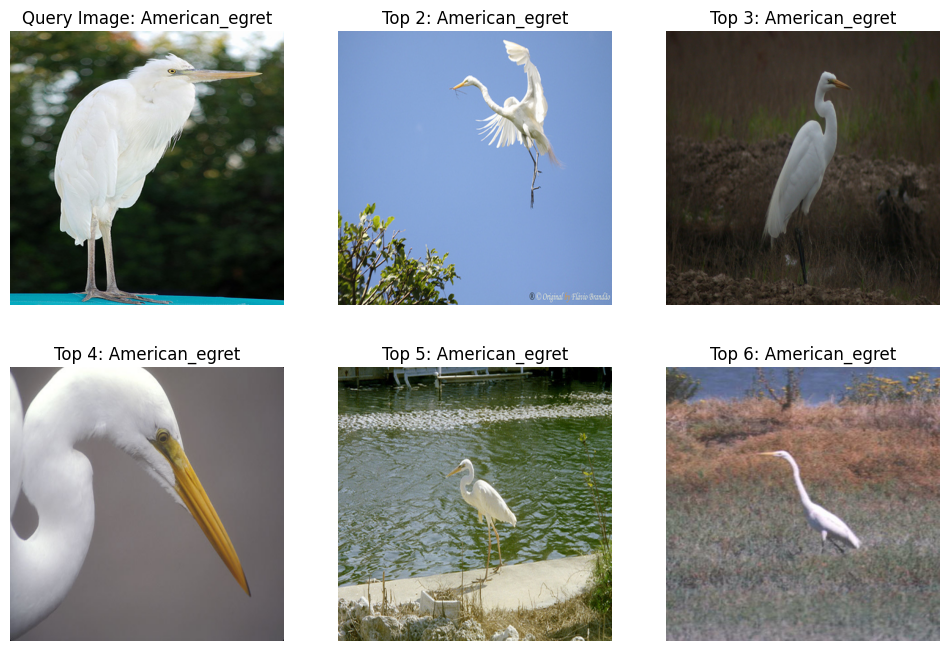

In [65]:
plot_results(image_path=test_path, files_path=files_path, results=l2_results)

Search Image with Cosine similarilty Collection

In [67]:
# Create a collection
cosine_collection = chroma_client.get_or_create_collection(name="Cosine_collection",
                                                           metadata={HNSW_SPACE: "cosine"})
add_embedding_optimized(collection=cosine_collection, files_path=files_path)

595it [00:35, 16.58it/s]


In [80]:
test_path = f'{ROOT}/test'
test_files_path = get_files_path(path=test_path)
test_files_path

['data/test/African_crocodile/n01697457_18534.JPEG',
 'data/test/American_egret/n02009912_2473.JPEG',
 'data/test/Doberman/n02107142_52285.JPEG',
 'data/test/Lakeland_terrier/n02095570_4644.JPEG',
 'data/test/Orange_easy/0_100.jpg',
 'data/test/Rhodesian_ridgeback/n02087394_18723.JPEG',
 'data/test/ambulance/n02701002_2311.JPEG',
 'data/test/apiary/n02727426_4398.JPEG',
 'data/test/bannister/n02788148_47071.JPEG',
 'data/test/barn_spider/n01773549_3207.JPEG',
 'data/test/basketball/n02802426_12693.JPEG',
 'data/test/black_widow/n01774384_10073.JPEG',
 'data/test/brain_coral/n01917289_311.JPEG',
 'data/test/bullet_train/n02917067_5772.JPEG',
 'data/test/can_opener/n02951585_15835.JPEG',
 'data/test/capuchin/n02492035_16570.JPEG',
 'data/test/car_mirror/n02965783_2850.JPEG',
 'data/test/carousel/n02966193_37997.JPEG',
 'data/test/castle/n02980441_11878.JPEG',
 'data/test/china_cabinet/n03018349_10581.JPEG',
 'data/test/cliff_dwelling/n03042490_10711.JPEG',
 'data/test/comic_book/n0659636

In [81]:

test_path = test_files_path[3]
cosine_results = search(image_path=test_path,
                        collection=cosine_collection, n_results=5)

In [82]:
cosine_results

{'ids': [['id_38', 'id_37', 'id_39', 'id_31', 'id_34']],
 'distances': [[0.17844915390014648,
   0.2231343388557434,
   0.27328020334243774,
   0.2767592668533325,
   0.34400296211242676]],
 'metadatas': [[None, None, None, None, None]],
 'embeddings': None,
 'documents': [[None, None, None, None, None]],
 'uris': None,
 'data': None,
 'included': ['metadatas', 'documents', 'distances']}

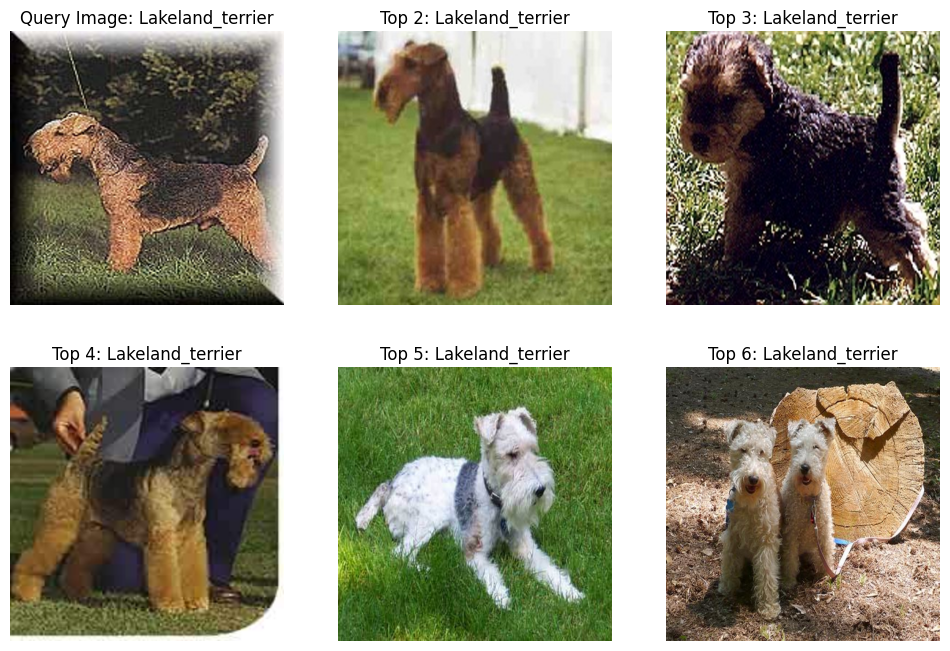

In [83]:
plot_results(image_path=test_path, files_path=files_path,
             results=cosine_results)